## 4-2. 내가 직접 만드는 강아지 고양이 분류기 (1) 이미지 분류 문제

In [46]:
import warnings
warnings.filterwarnings("ignore")

- 오늘 프로젝트에는 파이썬 "Pillow" 패키지가 필요합니다. 
- 인스톨이 되어있지 않다면 다음의 코드로 인스톨 해주세요.
- pip install pillow

**텐서플로우(TensorFlow)를 활용해서 이미지를 분류할 수 있는 모델을 설계**

In [47]:
import tensorflow as tf
print(tf.__version__)

2.2.0


----

## 4-3. 내가 직접 만드는 강아지 고양이 분류기 (2) 모델이 학습하려면? 공부할 데이터를 줘야지!

### 모델 학습을 위한 데이터셋(dataset) 준비하기

- 강아지, 고양이 이미지 데이터 필요
- tensorflow에서 제공하는 datasets 사용 예정
- 설치: 터미널 -> pip install tensorflow_datasets

In [48]:
import tensorflow_datasets as tfds

tfds.__version__

'3.2.1'

**tensorflow_datasets**
- 텐서플로우가 제공하는 데이터셋 모음집
- 강아지와 고양이 이미지뿐만 아니라 음성 데이터셋, 이미지 데이터셋, 텍스트 데이터셋 등 방대한 종류의 데이터셋을 제공
<br/>  
**[참고 링크]**   
https://www.tensorflow.org/datasets/catalog/overview

In [49]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)


- tensorflow_datasets 라이브러리를 tfds로 가져왔음
- 그 중 cats_vs_dogs 데이터를 사용
- 전체 train 데이터셋으로 설정되어 있는 데이터셋을, 80%, 10%, 10% 세 부분으로 나누어 각각 train_data, validation_data, test_data로 사용하겠다는 의미.

In [50]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


- 모든 데이터셋은 (image, label)의 형태를 가집니다.
- ((None, None, 3), ())가 이를 나타내죠.
- **=> (None, None, 3)**은 **image의 shape**를, **뒤의 ()**는 **정답 카테고리인 label의 shape**를 의미합니다.   
<br/>   
- 여기에서 이미지는 (height, width, channel)로 3차원 데이터
- (None, None, 3)과 같이 나타났습니다. 
- **Q. 이 때 height와 width => None으로 나타난 이유는 무엇일까요?**
- A. 모든 이미지의 크기가 전부 다르기 때문입니다. 정해져있지 않은 사이즈이기 때문에 None으로 나타낸 거죠.   
<br/>   
- **Q. 3이라는 숫자는 무엇을 나타낼까요?**
- A. 바로 이미지의 색을 표현하는 채널의 수
- 이미지 색은 RGB 3가지 색 조합
- 이미지를 컴퓨터 상에 나타낼 때 픽셀의 색은 RGB 3가지 색의 조합으로 나타냄
- 칼라: 3가지, 흑백 1개(white/black)   
<br/>   
- label은 특정 이미지가 강아지인지, 혹은 고양이인지를 나타내는 단일값
-  단순히 1차원의 숫자 하나로 표현될 수 있기 때문에 차원이 따로 나타나지 않음



----

## 4-4. 내가 직접 만드는 강아지 고양이 분류기 (3) 데이터가 있다고 끝은 아니야, 이쁘게 다듬는 작업은 필수!

- 데이터 시각화를 통해 확인하고, 모델에 입력할 수 있는 형태로 전처리 하기

In [51]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

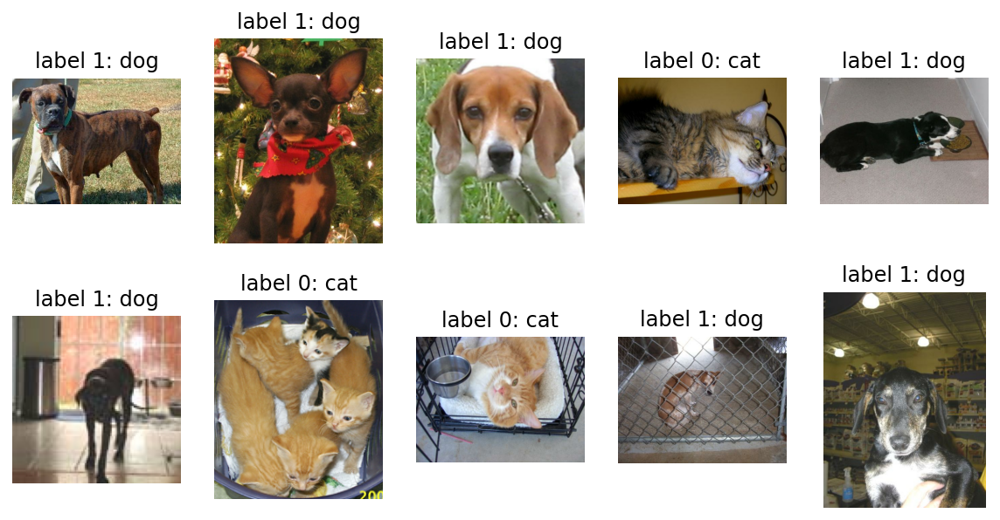

In [52]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

- **raw_train** 안에 있는 데이터를 확인해 보기 위해 **tf.data.Dataset**에서 제공하는 **take**라는 함수를 사용
- 이 함수는 인수로 받은 만큼의 개수만큼의 데이터를 추출하여 새로운 데이터셋 인스턴스를 생성하여 리턴하는 함수
- 강아지: label 1, 고양이: label 0
- **=> 모델 학습 시 이미지 사이즈를 통일시켜주는 작업 진행 해야함**

In [53]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

- 위 코드는 이미지의 사이즈를 160x160 픽셀로 통일시킬뿐만 아니라
- 각 픽셀 값의 scale을 수정해주는 역할
- **Q. 픽셀값은 RGB 색을 나타날 때 0~255 사이의 정수값, 위 코드 실행 시 각 픽셀 값 범위는 ?** 
- A. 각 픽셀 범위는 **-1 ~ 1**

In [54]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

- **format_example** 함수를 raw_train, raw_validation, raw_test 에 map 함수로 적용시켜서 우리가 원하는 모양의 train, validataion, test 데이터셋으로 변환
- 리스트 원소 전체에 동일한 변환 함수를 for문을 사용하지 않고 손쉽게 적용하게 해주는 **map** 함수   
<br/>   
- **map 함수 [참고 자료]**
- https://dojang.io/mod/page/view.php?id=2286

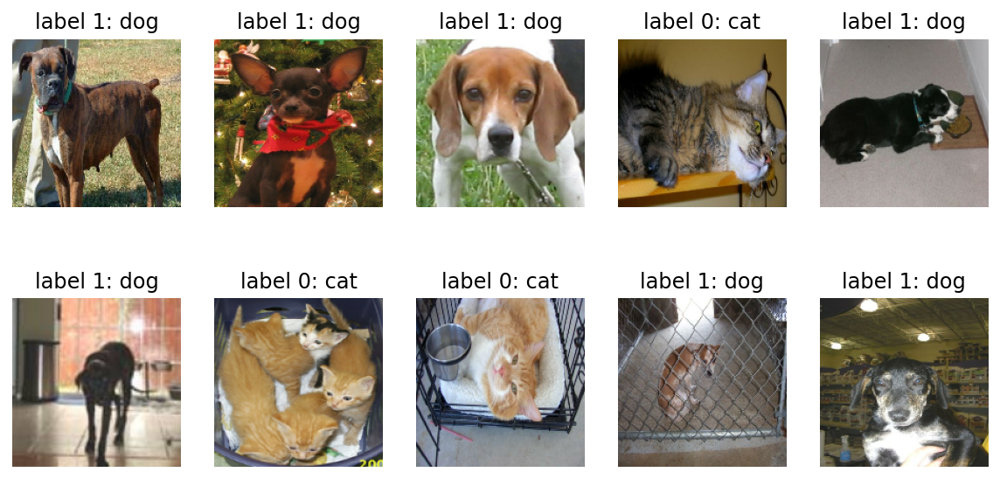

In [55]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

- 모든 이미지의 크기가 160x160으로 동일해짐
- **IMG_SIZE**를 160으로 지정하여 모든 이미지 크기를 (160, 160, 3)으로 통일

----

## 4-5. 내가 직접 만드는 강아지 고양이 분류기 (4) 데이터가 준비되었으니, 이제 모델을 만들어보자

### 텐서플로우를 활용해 모델 구조 설계하기
- 이미지 준비가 끝났음
- 이미지들로 학습시킬 모델 만들어야 함

In [56]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

- **models**: 모델 그 자체를 구축하기 위한 함수들을 포함
- **layer**: 모델의 구성 요소인 여러가지 종류의 layer, 즉 "층"이라는 함수를 가지고 있음
- **Sequential**: "연속적인" 모델을 쌓기 위한 함수
- -> Sequential 함수 안에 연속적으로 여러가지 layer들이 들어감

In [57]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

- 딥러닝 모델은 위와 같이 여러 개의 층을 쌓은 형태로 구성
- **Conv2D, MaxPooling2D, Flatten, Dense** 라는 네 가지 종류의 layer를 사용

In [58]:
model.summary()    # 모델 전체 구조 Summary로 확인

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 25600)            

- 딥러닝 모델은 layer가 층층이 쌓인 구조
- 모델에 입력하는 이미지의 크기가 (160, 160, 3)이었음
- summary()에서 출력된 표 (160, 160, 3) 크기의 이미지가 모델에 입력된 후 각 layer를 지나면서 그 이미지의 사이즈가 어떻게 변화하는지 나타내주고 있음   
<br/>   
- height와 width는 160 → 80 → 40 → 20 으로 점점 작아지고,
- channel은 16 → 32 → 64까지 커지고 있다.
- flatten 계층을 만나 25,600이라는 하나의 숫자로, 1차원 shape가 줄어 듦.
- 여기서 처음 6개의 레이어를 지나고 난 후의 shape는 모두 (None, height, width, channel)로 4차원    
<br/>    
- 첫 번째 차원은 데이터의 개수 => 여기서는 정해지지 않은 수 None 기호.
- **None**은 배치(batch) 사이즈에 따라 모델에 다른 수의 입력이 들어올 수 있음    
<br/>   
- CNN(Convolutional Neural Net)에서 점점 작은 feature map이 출력되다가 Flatten과 Dense 레이어를 거쳐 1차원으로 shape이 줄어드는 네트워크는 CNN을 사용한 딥러닝 모델의 가장 대표적인 형태

In [59]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

- Flatten을 직관적으로 이해해보기 위해 배열을 다루기 용이한 numpy를 활용하여 표현
- (2,2) 크기를 flatten 시키기|

In [60]:
image.flatten()

array([1, 2, 3, 4])

- flatten을 통해 모든 숫자를 일렬로 편 상태로 나타남
- 모델에서 flatten 레이어를 통과하는 것도 위와 같이 모든 숫자를 일렬로 펼쳐 놓음
- Dense 레이어에서 512개 노드로 축소 후 마지막 최종 출력은 단 두개의 숫자로 구성된 하나의 확률분포로 표현
- 두 숫자는 강아지 또는 고양이를 의미   
<br/>   
**[정리]**
- 딥러닝 모델은 (160, 160, 3) 크기의 3차원 이미지를 입력받아 여러 레이어를 거치며 형태를 바꾸다가 최종적으로 몇 개의 숫자를 출력해내는 함수

----

## 4-6. 내가 직접 만드는 강아지 고양이 분류기 (5) 모델아 모델아, 데이터를 먹고 똑똑해지렴!

### 모델 compile 완료 후 학습시키기

**모델 학습**

In [61]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])


모델이 학습하는 데에 필요한 **"학습률"(learning_rate)**이라는 **파라미터를 0.0001**으로 설정해주고, **모델을 compile** 하여 학습할 수 있는 **형태로 변환**   
<br/>   
**compile**하기 위해 필요한 3가지
- **optimizer**는 학습을 어떤 방식으로 시킬 것인지 결정합니다. 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수라고 부르기도 합니다.
- **loss**는 모델이 학습해나가야 하는 방향을 결정합니다. 이 문제에서는 모델의 출력은 입력받은 이미지가 고양이인지 강아지인지에 대한 확률분포로 두었으므로, 입력이미지가 고양이(label=0)일 경우 모델의 출력이 [1.0, 0.0]에 가깝도록, 강아지(label=1)일 경우 [0.0, 1.0]에 가깝도록 하는 방향을 제시합니다.
- **metrics**는 모델의 성능을 평가하는 척도입니다. 분류 문제를 풀 때, 성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall) 등이 있습니다.

**--- 3 가지 모두 정해주면서 compile을 마무리 하면 모델 학습 준비 완료 ---**

**모델에 학습시킬 데이터 준비

In [62]:
BATCH_SIZE = 32                  # 한 스텝에 학습시킬 데이터 개수
SHUFFLE_BUFFER_SIZE = 1000       # 학습데이터를 적절히 섞어 줌

- 그 후 **BATCH_SIZE**에 따라 32개의 데이터를 랜덤으로 뿌려줄 **train_batches, validation_batches, test_batches**를 만들어 주겠습니다.
- **train_batches**는 모델이 끊임없이 학습할 수 있도록 전체 데이터에서 32개를 랜덤으로 뽑아 계속 제공해 줄 것입니다.

In [63]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [64]:
for image_batch, label_batch in train_batches.take(1):
    pass
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

- train_batches에서 하나의 batch만 꺼내 데이터를 확인 결과
- **image_batch**의 **shape**는 **[32, 160, 160, 3]**을, **label_batch**의 **shape**는 **[32]**를 나타냅니다.

**모델을 학습시키기 전, 초기 모델 성능 확인**

- **validation(검증)**을 하기 위한 데이터셋인 **validation_batches**를 이용해 20번의 예측을 해 보고 **평균 loss와 평균 accuracy**를 확인

In [65]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 0s 16ms/step - loss: 0.6962 - accuracy: 0.4875
initial loss: 0.70
initial accuracy: 0.49


- **loss**: 약 0.7
- **accuracy**: 약 0.5   
<br/>   
- **loss**: **"손실"** 이라는 뜻, 얼마나 모델이 **"틀렸는지"** 나타냄. 즉, 낮을 수록 좋음
- **accuracy**: **"정확도"** 이라는 뜻, 얼마나 모델이 몇 퍼센트의 **"정확도"**를 보이는 수치   
<br/>   
- 강아지와 고양이를 분류하려고 하는데, 두 장 중 하나를 찍어도 50%는 나올테니 지금 모델은 전혀 의미없는 예측을 하고 있는 것이라고 할 수 있음

[10 epoch를 학습시켜서 정확도가 어떻게 변하는지 확인해 보겠습니다]

In [66]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 19s 33ms/step - loss: 0.5949 - accuracy: 0.6701 - val_loss: 0.5677 - val_accuracy: 0.6999
Epoch 2/10
582/582 [==============================] - 19s 33ms/step - loss: 0.4862 - accuracy: 0.7625 - val_loss: 0.5035 - val_accuracy: 0.7644
Epoch 3/10
582/582 [==============================] - 19s 33ms/step - loss: 0.4208 - accuracy: 0.8070 - val_loss: 0.4957 - val_accuracy: 0.7678
Epoch 4/10
582/582 [==============================] - 19s 33ms/step - loss: 0.3655 - accuracy: 0.8376 - val_loss: 0.4760 - val_accuracy: 0.7889
Epoch 5/10
582/582 [==============================] - 19s 33ms/step - loss: 0.3137 - accuracy: 0.8666 - val_loss: 0.4712 - val_accuracy: 0.7846
Epoch 6/10
582/582 [==============================] - 19s 33ms/step - loss: 0.2644 - accuracy: 0.8932 - val_loss: 0.4881 - val_accuracy: 0.7790
Epoch 7/10
582/582 [==============================] - 19s 33ms/step - loss: 0.2137 - accuracy: 0.9153 - val_loss: 0.5062 - val_accuracy:

---

## 4-7. 내가 직접 만드는 강아지 고양이 분류기 (6) 모델은 얼마나 똑똑해졌을까? 확인해 보자!

### 모델 학습곡선 확인 및 예측 결과 시각화하기

- 첫 번째 accuracy는 train datasets에 대한 정확도   
-> 학습하고 있는 데이터에 대한 정확도   
<br/>
- 두 번째 val_accuracy는 validation datasets에 대한 정확도   
-> 학습하지 않고 있는, 즉 해당 학습 단계에서 보지 않은 데이터에 대한 정확도   
<br/>   
결론적으로, 당연히 train datasets에 대한 정확도가 높은 것은 직관적임.

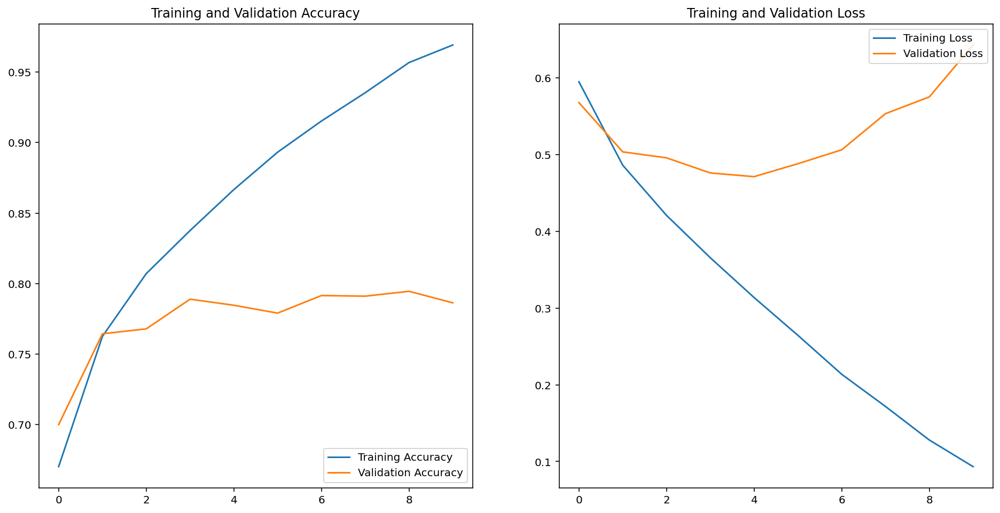

In [67]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

- training accuracy는 꾸준히 오르지만 검증 정확도는 어떤 한계선을 넘지 못함
- loss 그래프에서, training loss는 계속 안정적으로 줄어들지만 validation loss값은 특정 순간 이후로 다시 커지는 모습을 보임   
<br/>   
- 이러한 문제를 **"과적합(Overfitting, 오버피팅)"**이라 칭함
- 모델의 성능이 제대로 올라가려면 "학습하지 않은" 데이터에 대해서도 성능이 좋아야 하는데, 훈련 데이터만으로 계속 학습하다보니 그 데이터에만 과도하게 적합(fitting) 되어서 일반화 능력이 떨어지게 됨
- 딥러닝 모델을 학습시킬 때에는 이러한 과적합 문제를 예민하게 다루고, 과적합이 되지 않는 순간을 잘 잡아내 일반화가 잘 되는 모델로 학습시키는 것이 중요

**모델의 예측 결과 확인 "model.preict" 활용**

In [68]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99965429e-01, 3.46171182e-05],
       [9.79978919e-01, 2.00210363e-02],
       [6.79725111e-02, 9.32027459e-01],
       [9.99960542e-01, 3.94738199e-05],
       [3.86855900e-01, 6.13144100e-01],
       [2.38868035e-02, 9.76113141e-01],
       [1.73405949e-02, 9.82659459e-01],
       [9.89483178e-01, 1.05167674e-02],
       [3.99881490e-02, 9.60011780e-01],
       [1.64236009e-01, 8.35763931e-01],
       [1.12312399e-02, 9.88768697e-01],
       [9.99981999e-01, 1.80001625e-05],
       [9.87872958e-01, 1.21270325e-02],
       [3.77935885e-06, 9.99996185e-01],
       [9.98821080e-01, 1.17886846e-03],
       [9.99180853e-01, 8.19073815e-04],
       [5.17796159e-01, 4.82203901e-01],
       [6.40719463e-07, 9.99999404e-01],
       [9.15407538e-01, 8.45924467e-02],
       [9.99294877e-01, 7.05052633e-04],
       [4.76103842e-01, 5.23896158e-01],
       [9.97774303e-01, 2.22563697e-03],
       [9.98914361e-01, 1.08568789e-03],
       [9.54472303e-01, 4.55277450e-02],
       [9.719598

- 이는 모델이 판단한 [고양이일 확률, 강아지의 확률]
- [1.0, 0.0]에 가까울수록 label이 0인 **고양이**
- [0.0, 1.0]에 가까울수록 label이 1인 **강아지**로 예측했다고 볼 수 있음.

- prediction 값들을 실제 추론한 라벨(고양이:0, 강아지:1)로 변환
- 실제로 모델은 각 이미지를 강아지라고 판단했는지, 고양이로 판단했는지 보기 위함

In [69]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0])

32장의 image들과 32개의 label, 그리고 32개의 prediction을 얻었으니 각각을 모두 시각화해서 확인

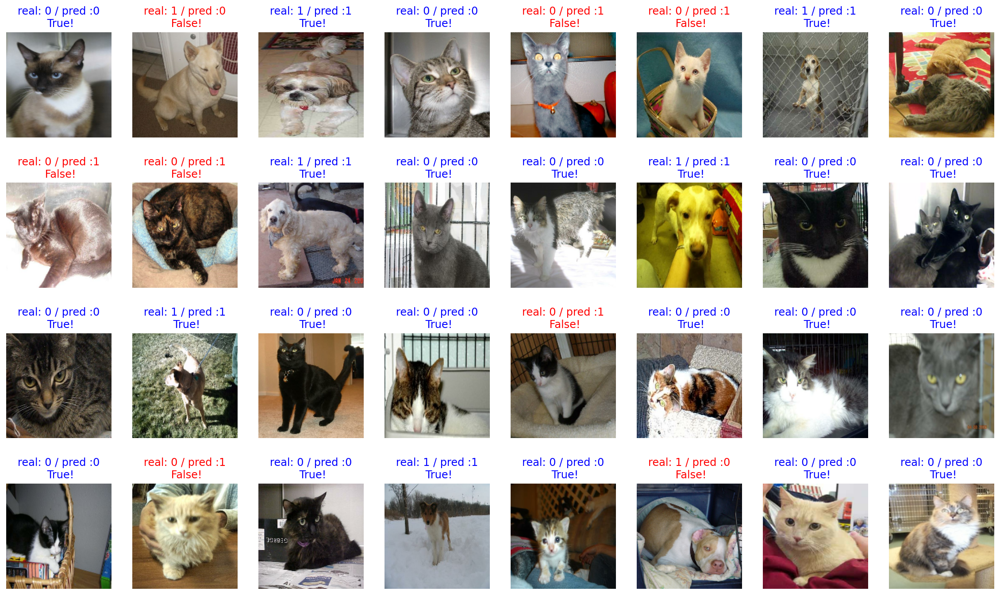

In [70]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

위의 32개 이미지에 대해 직접 맞은 예측의 개수

**평가**

In [71]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    # [[YOUR CODE]]
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)    # 약 70% 내외

75.0


----

## 4-8. 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (1) 어려운 문제는 직접 풀지 말자, 똑똑한 누군가가 이미 풀어놨을테니!

### 이미지 분류 대회인 ILSVRC, ImageNet이 무엇인지 알아보고, Transfer Learning의 개념 알아보기

**CNN**

**1. Convolutional base**: 합성곱층과 풀링층이 여러겹 쌓여있음. 

→ 이미지로부터 특징을 효과적으로 추출하는 것(feature extraction)  
<br/>
**2. Classifier**: 완전 연결 계층으로 이루어짐. 

→ 추출된 특징을 잘 학습해서 이미지를 알맞은 카데고리로 분류하는 것(image classification)

<br/>

**Convolutional based 각 계층의 의미**

- 낮은 레벨의 계층(input에 가까운 계층)일수록 일반적인 특징을 추출
- 높은 레벨의 계층(output에 가까운 계층)과 classifier 부분은 보다 구체적이고 특유한 특징을 추출

. **전이학습 3가지 전략**

*전의학습: 사전에 학습된 모델을 내 프로젝트에 맞게 재정의

- **전략 1**

→  전체 모델을 새로 학습시키는 것이다. 이 경우에는 사전학슴 모델의 구조만 사용한다. 모델을 완전히 새로 학습시켜야하므로, 큰 사이즈의 데이터셋과 좋은 컴퓨팅 연산 능력이 있을 때 적합하다.

- **전략 2**

→ Convolutional base의 일부분은 고정시킨 상태로, 나머지 계층과 classifier만 새로 학습시키는 것이다. 데이터셋의 크기에 따라 얼마나 많은 계층을 새로 학습시킬지 달라지는데, 데이터의 양이 많을수록 더 많이 새로 학습시키고, 데이터의 양이 적을수록 학습시키는 부분을 적게 한다.

- **전략 3**

→ Convolutional base는 고정시키고, classifier만 새로 학습시키는 것이다. 이 경우는 convolutional base는 건들지 않고 그대로 두면서 특징 추출 매커니즘으로 활용하고, classifier만 재학습시키는 방법이다. 컴퓨팅 연산능력이 부족하거나 데이터셋이 작을 때 고려해볼 수 있다.

----

## 4-9. 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (2) 아주 똑똑한 모델을 간단히 가져오는 방법

### 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기

- VGG는 단순한 구조임에도 괜찮은 성능을 보여 아직까지 많은 이미지 처리 분야에서 사용   
<br/>
- VGG 모델을 base_model의 변수로 불러오겠습니다.
- 이전 스텝에 언급한 대로, VGG 모델을 가져올 때, output에 가까운 높은 레벨에 있는 3개의 FC 레이어는 제외하고 불러와야 하므로 include_top=False 옵션을 주었다는 것을 참고.   
<br/>   
- 텐서플로우 케라스에서 제공하는 VGG16 모델에 대한 상세한 내용은 아래 링크를 참고해 주세요.
- https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG16

In [73]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58892288/58889256 [==============================] - 8s 0us/step


- 방금 이미 잘 학습된 모델을 가져 온 것임
- 이 모델은 입력된 이미지를 입력받으면 해당 이미지의 특징을 잘 뽑아낸 특징 벡터를 추출

In [75]:
image_batch.shape     # 학습할 때 사용했던 데이터를 넣기 전 사이즈 확인

TensorShape([32, 160, 160, 3])

In [76]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

- 이미지 개수는 32개로 동일 / 이미지 사이즈는 160 -> 5 변화 / 체널 3 -> 512 변화
- 이 벡터는 이미지에서 특징을 추출해 낸 **"특징 벡터"**라고 부름

In [77]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

- 기존에 우리가 만들었던 딥러닝 모델보다 복잡함
- 여러 개의 행 => 레이어의 개수가 여러 개   
<br/>  
- **[모델 구조 참고]**
- https://neurohive.io/en/popular-networks/vgg16/

**Q. VGG16 모델에는 총 네 가지 종류의 레이어만 쓰였습니다. 각각의 레이어는 무엇입니까?**
- A. Conv(Convolutional layer), Pooling(MaxPooling layer), Dense(Fully connected layer), softmax layer   
<br/>   
**Q. VGG16 모델은 총 5개의 Conv-pooling 블록과 1개의 Dense 블록으로 구성되어 있습니다. 각 블록은 몇 개의 레이어로 구성되어 있습니까?**
- A. 
- 첫 번째 블록 : 2개의 Conv 레이어와 1개의 Pooling 레이어
- 두 번째 블록 : 2개의 Conv 레이어와 1개의 Pooling 레이어
- 세 번째 블록 : 3개의 Conv 레이어와 1개의 Pooling 레이어
- 네 번째 블록 : 3개의 Conv 레이어와 1개의 Pooling 레이어
- 다섯 번째 블록 : 3개의 Conv 레이어와 1개의 Pooling 레이어
- 여섯 번째 블록 : 3개의 Dense 레이어
- **[그림 참고]**
<br/>   
**Q. 하지만 우리가 위에서 가져온 모델의 model.summary()를 보면 무언가가 빠져있습니다. 어떤 블록이 빠졌으며, 왜 빠졌을까요?**   
- A. 마지막의 Dense 레이어로 이루어진 블록이 빠졌다. 이 블록은 우리가 Transfer Learning을 수행하며 새로 학습시킬 것이기 때문에 빠진 부분이다.   

----

## 4-10. 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (3) 모델의 마지막 부분만, 내 입맛대로 재구성하기

### VGG16 끝단에 classifier 레이어 붙여서 원하는 구조의 분류 모델 만들기


- VGG16 모델을 가져와서 모델이 이미지로부터 특징을 추출하는 벡터를 내뱉는다는 것을 확인했습니다.
- 모델이 추출한 특징 벡터로부터 분류를 할 수 있는 classifer를 구성해야함
- VGG16 모델이 출력한 벡터의 Shape => (32, 5, 5, 512)   
<br/>
- classifier를 구성하려면 Fully connected 레이어로 구성해야함
- Fully connected: 완전연결 계층 / 이전 계층들의 모든 숫자들이 다음 계층의 모든 숫자와 연결되어야 함
- Fully connected 레이어에 입력될 수 있는 벡터는 반드시 **1차원**   
<br/>
- VGG16은 3차원 구조(5, 5, 512)
- classifier 구성 전에 3차원 벡터를 1차원 벡터로 변환하는 작업 시행   
<br/>   
**Q. Step 1에서 우리가 직접 모델을 설계하며 3차원의 벡터를 1차원 벡터로 쭉 편 레이어는 무슨 레이어였을까요?**
- A. Flatten 레이어



**Flatten layer 작업 과정 확인 코드**

In [78]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


- 2차원 or 3차원 벡터 -> 1차원 벡터로 축소 시키는 방법
- Flattening 하는 것 보다 더 좋은 방법이 있음   
**=> Global Verage Pooling**
- https://peltarion.com/knowledge-center/documentation/modeling-view/build-an-ai-model/blocks/2d-global-average-pooling   
<br/>

**Q. Global Average Pooling을 거치게 되면 (Height, Width, Depth)의 shape를 가지는 3차원 이미지의 shape가 어떻게 바뀌게 되나요?**   
A. (1, 1, Depth)로 바뀌게 된다. 이는 그냥 (Depth)의 shape로, 1차원 벡터로 볼 수 있다.   
<br/>   
- Global Average Pooling은 3차원의 벡터가 있을 때, 겹겹이 쌓여있는 2차원 배열을 평균취한 후 하나의 값으로 축소시키는 기법
- 위 그림에서는 왼쪽의 3차원 배열에서 맨 앞 장인 [[1, 5, 4, 5], ..., [8, 6, 8, 7]] 에 있는 16개 숫자를 모두 평균 취하면 5라는 숫자가 되죠.
- 이렇게 평균값을 활용해 벡터의 차원을 줄이는 방법을 Global Average Pooling이라고 합니다.   
<br/>   
**Q. 그렇다면 우리는 VGG16이 출력한 벡터가 [32, 5, 5, 512]였으니, Global Average Pooling을 취하면 벡터의 shape가 어떻게 변하게 될까요?**   
A. [32, 1, 1, 512]가 된다. 이는 [32, 512]로 볼 수 있다.



**Global Average Pooling 계층 만드는 코드 확인**

In [79]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

global_average_layer에 위에서 VGG16이 출력했던 feature_batch를 입력하면 어떻게 될까요?

In [80]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


마지막으로 Dense 레이어를 붙여주면 우리의 classifier가 완성

In [82]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


- 우리의 데이터들은 처음에 이미지에서 특징을 추출해 줄 **VGG16**, **base_model**에 입력되어 특징이 추출된 다음
- 그 특징벡터는 **global_average_layer**를 거쳐 마지막에 **prediction_layer**까지 통과하며 강아지인지, 고양이인지 예측이 될 것입니다.
- **VGG16**에 해당하는 **base_model**은 학습을 시키지 않을 예정이니 학습 여부를 결정하는 **trainable 변수를 False로 지정해 "꺼주겠"습니다.**

In [83]:
base_model.trainable = False

**최종 모델 만들기**

In [84]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

**모델의 구조 확인**

In [85]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


- VGG16 안에는 위에서 봤던 매우 복잡한 레이어들이 들어있는데
- 우리가 base_model로 추상화시켰기 때문에 간결하게 나타납니다.
- 모델이 완성되었으니, 이제 학습만 시키면 됨!

-----

## 4-11. 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (4) 거인의 어깨에 올라타서 예측하니, 더 잘 예측할 수밖에!

### VGG16을 기반으로 구성된 이미지 분류기를 학습시키고, 직접 만들었던 모델과 결과 비교해 보기

**모델 학습은 위에 했던 과정과 동일**
- optimizer, loss, metrics를 준비해서 모델을 compile

In [87]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [88]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 1s 60ms/step - loss: 1.0309 - accuracy: 0.4703
initial loss: 1.03
initial accuracy: 0.47


- 아직 학습되지 않은 상태니 정확도 약 50%

In [1]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

NameError: name 'model' is not defined

- **모델 학습**을 통해 최종 성능 확인 가능

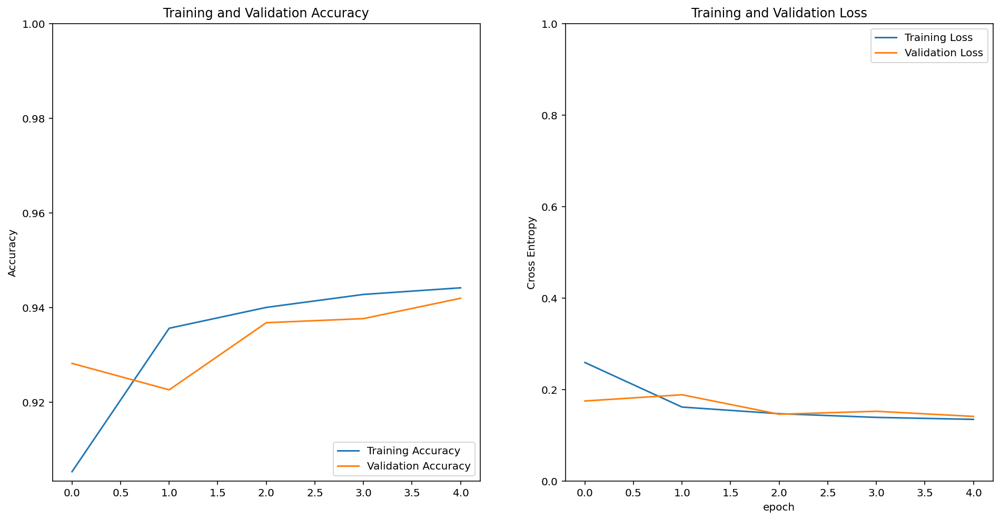

In [90]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

- 그래프로 학습 과정 보기
<br/>   
- 우리가 직접 만들었던 모델과는 다르게 시작부터 75%를 넘는 정확도에서 꾸준히 올라갈뿐더러 validation loss도 매우 안정적으로 학습됩니다.
- 위에서 했던 것과 같이 또 32개의 test sample에 대한 예측 결과를 눈으로도 확인해 보겠습니다.
- 샘플을 test_batches에서 가져와서 예측 결과를 만들어 보기!

In [91]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9998951e-01, 1.0465670e-05],
       [1.0129537e-01, 8.9870465e-01],
       [2.9156819e-01, 7.0843184e-01],
       [9.9999583e-01, 4.1664616e-06],
       [9.9726057e-01, 2.7394302e-03],
       [9.8475176e-01, 1.5248258e-02],
       [1.2752585e-04, 9.9987245e-01],
       [6.0946155e-01, 3.9053845e-01],
       [9.5066684e-01, 4.9333137e-02],
       [9.5895934e-01, 4.1040689e-02],
       [5.9574359e-05, 9.9994040e-01],
       [9.9992418e-01, 7.5810720e-05],
       [9.8748940e-01, 1.2510595e-02],
       [3.2206945e-06, 9.9999678e-01],
       [9.9810922e-01, 1.8907818e-03],
       [9.8332942e-01, 1.6670654e-02],
       [9.9471843e-01, 5.2815140e-03],
       [2.0957869e-02, 9.7904211e-01],
       [5.8669519e-01, 4.1330475e-01],
       [9.9399394e-01, 6.0060774e-03],
       [9.0776932e-01, 9.2230730e-02],
       [9.7737598e-01, 2.2623990e-02],
       [9.9295205e-01, 7.0478828e-03],
       [9.6533740e-01, 3.4662597e-02],
       [9.9794918e-01, 2.0508762e-03],
       [9.7746676e-01, 2.

- 0과 1 사이의 값으로 확률을 출력

In [92]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

- predeiction 값들을 실제 추론한 라벨(Cat:0, Dog:1)로 변환

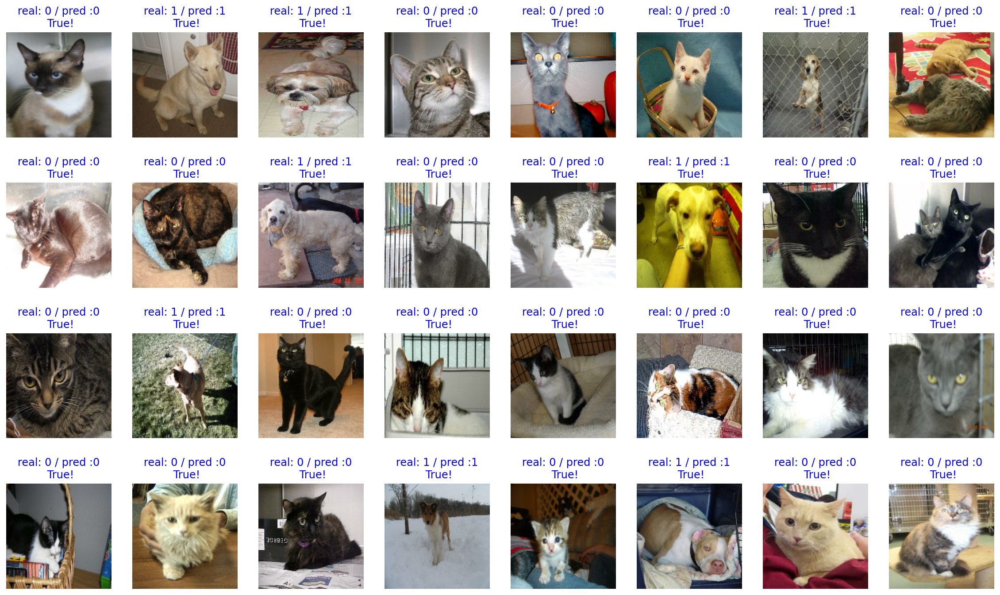

In [93]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

- 아까보다 훨씬 잘 맞춤! 어려울 수 있는 이미지도 잘 맞춤.

In [94]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0


- 32개에 대한 정확도를 확인
- 거의 100%에 가까운 정확도를 보여줌   
<br/>   
- Transfer Learning의 위력을 실감할 수 있었음
- 이미지 분류할 때는 직접 모델을 만들기보단, 똑똑한 모델을 가져아서 사용하는 것이 좋음!

----

## 4-12. 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (5) 잘 학습된 모델은 저장해두고, 언제든 꺼내 쓰도록 하자!

### 모델을 save 하고, 다시 load 해와서 사용하는 방법 익히기

**[모델 저장 방법]**
- **save_weights** 함수 활용
- 파라미터로 저장하고 싶은 경로 입력
- 다음과 같이 ./checkpoint/checkpoint 라는 경로로 저장하게 되면 
- 현재 위치에 있는 checkpoint라는 폴더 내에 checkpoint라는 파일명으로 저장됩니다.
- 단, checkpoint 폴더가 존재하지 않는다면 에러가 발생하므로, 다음과 같이 터미널을 열어 해당 폴더를 만들어주는 것이 안전합니다.   
<br/>   
- mkdir -p ~/aiffel/cat_vs_dog
- mkdir -p ~/aiffel/cat_vs_dog/checkpoint
- mkdir -p ~/aiffel/cat_vs_dog/images

In [96]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


------

## 4-13. 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (6) 거울아 거울아, 나는 멍멍이 상이니, 아니면 냥이 상이니?

### 학습된 모델에 원하는 이미지를 입력해 예측 결과 확인해 보기

In [101]:
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

- image 폴더에 원하는 이미지 넣기!
- 연습용 my_dog.jpeg라는 파일과 my_cat.jpeg 파일 저장   
<br/>   
**tensorflow 모델에 입력해주기 위해 load_img, img_to_array 함수 가져오기**

In [102]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array


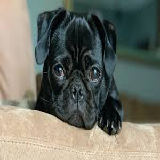

In [103]:
IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpeg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

- image, size ok
- image **array** 배열 자료형 변환 진행

In [104]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [105]:
prediction = model.predict(dog_image)
prediction

array([[0., 1.]], dtype=float32)

**예측 결과**
- Cat => [1.0, 0.0]
- Dog => [0.0, 0.1]

In [106]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")
    
    
    
    

- 위와 같이 함수를 짜두면 filename만 바꾸어 원하는대로 실험해볼 수 있습니다.

This image seems 100.0% dog, and 0.0% cat.


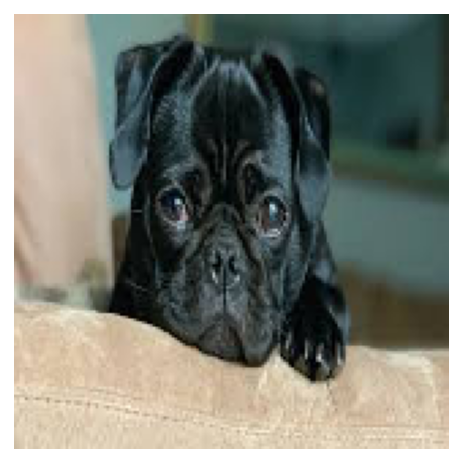

In [110]:
filename = 'my_dog.jpeg'      # 강아지 이미지를 함수에 넣기

show_and_predict_image(img_dir_path, filename)

This image seems 0.0% dog, and 100.0% cat.


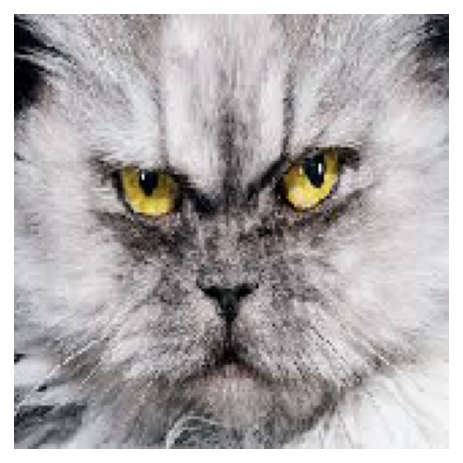

In [111]:
filename = 'my_cat.jpeg'    # 고양이 이미지를 함수에 넣기

show_and_predict_image(img_dir_path, filename)

This image seems 100.0% dog, and 0.0% cat.


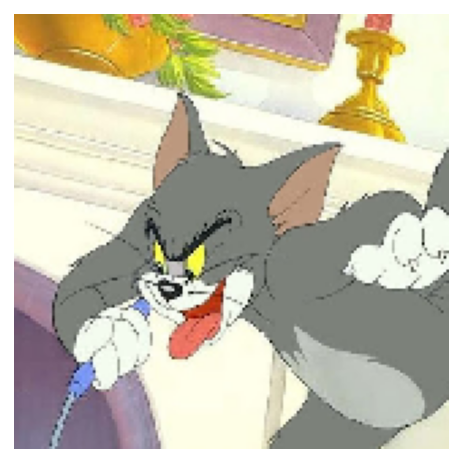

In [114]:
filename = "cat_face1.jpg"   # 고양이상으로 보이는 얼굴의 경우 함수에 넣기
show_and_predict_image(img_dir_path, filename)

This image seems 100.0% dog, and 0.0% cat.


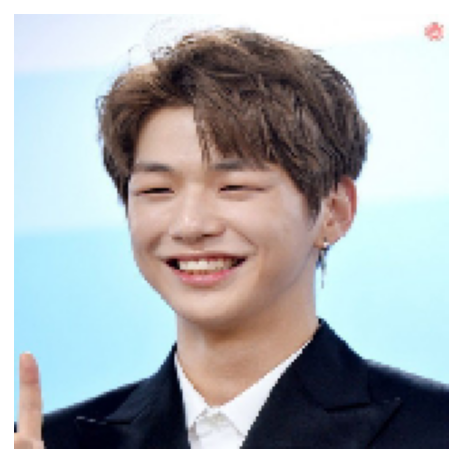

In [115]:
filename = "cat_face2.jpg"   # 고양이상으로 보이는 얼굴의 경우 함수에 넣기
show_and_predict_image(img_dir_path, filename)